In [ ]:
import os
os.getpid()

In [ ]:
import sys
sys.executable

In [ ]:
from IPython.display import Image

In [ ]:
from pathlib import Path

from tqdm.auto import tqdm
import cv2 as cv

In [ ]:
data_path = Path('data/misaligned_images/misaligned_images/')

In [ ]:
sample_img = Path('data/misaligned_images/misaligned_images/0f97914844b786b0d2ef21339286cdf6 - 2.jpg')

In [ ]:
Image(sample_img)

### The task is to rotate the image such that it is aligned correctly, i.e. so that text is horizontal

In [ ]:
img = cv.imread(str(sample_img))

In [ ]:
img.shape

In [ ]:
from scipy import stats
import numpy as np
from skimage.io import imread
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
import numpy as np
from skimage.feature import canny
from skimage.transform import rotate
# combining everything together in a single function.
def detect_skew_angle_fourier_tranform(image):
    # find the edges in the image
    edges = canny(image)
    
    # fourier transform 2d on the edge images
    f = np.fft.fft2(edges)
    
    # shift the frequencies to center to see the values
    fshift = np.fft.fftshift(f)
    
    # take only the real part from the complex values of fshift.
    magnitude_spectrum = np.log(np.abs(fshift))
    
    # to find the angle the center line makes with the x axis.
    # first remove the center pixel.
    r,c = magnitude_spectrum.shape
    magnitude_spectrum[int(r/2),int(c/2)] = 0
    
    # sort all the frequencies by their value in descending order and pick the top 30 points.
    
    # create pair of frequency, x_index, y_index.
    frequency_and_indexes = []
    for ri in range(r):
        for ci in range(c):
            frequency_and_indexes.append([magnitude_spectrum[ri][ci], ci, ri])
    frequency_and_indexes = np.array(frequency_and_indexes)
    
    # sorted by the frequency value at column 0 and take the last 30 values.
    frequency_and_indexes = frequency_and_indexes[frequency_and_indexes[:,0].argsort()[::-1]][:30]
    
    # find the rotation angle by using the linear regression method.
    slope, intercept, r_value, p_value, std_err = stats.linregress(frequency_and_indexes[:,1],frequency_and_indexes[:,2])
    rotation_angle = np.round(np.rad2deg(np.arctan(slope)-np.pi/2), decimals=2)
    
    return rotation_angle

In [19]:
from skimage.color import rgb2gray
image = rgb2gray(imread(sample_img))

In [42]:
def deskew_fft(image_path):
    image = rgb2gray(imread(image_path))
    # image is grayscale
    rotation_angle = detect_skew_angle_fourier_tranform(image)
    fig, ax = plt.subplots(ncols=2, figsize=(20,20))
    ax[0].imshow(image, cmap="gray")
    ax[0].set_title(image_path.name)
    ax[1].imshow(rotate(image, rotation_angle, cval=1), cmap="gray")
    ax[1].set_title('Image rotated by angle ' + str(rotation_angle)+' degrees')
    plt.show()

In [43]:
images_path = list(data_path.rglob('*.jpg'))

  0%|          | 0/24 [00:00<?, ?it/s]

data/misaligned_images/misaligned_images/law-firm-invoice-template.jpg


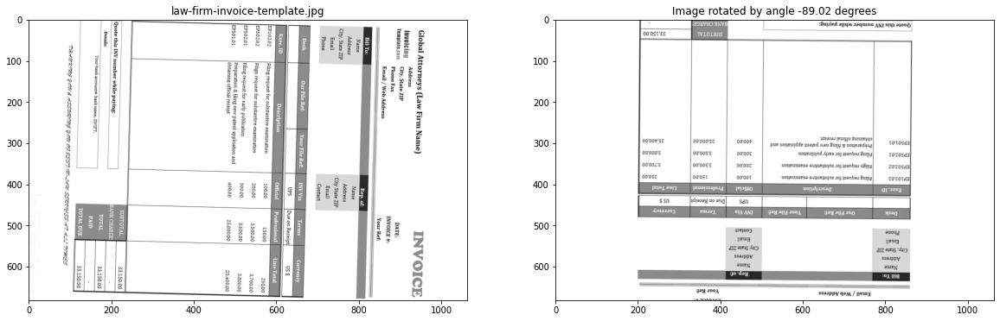

data/misaligned_images/misaligned_images/0f97914844b786b0d2ef21339286cdf6 - 2.jpg


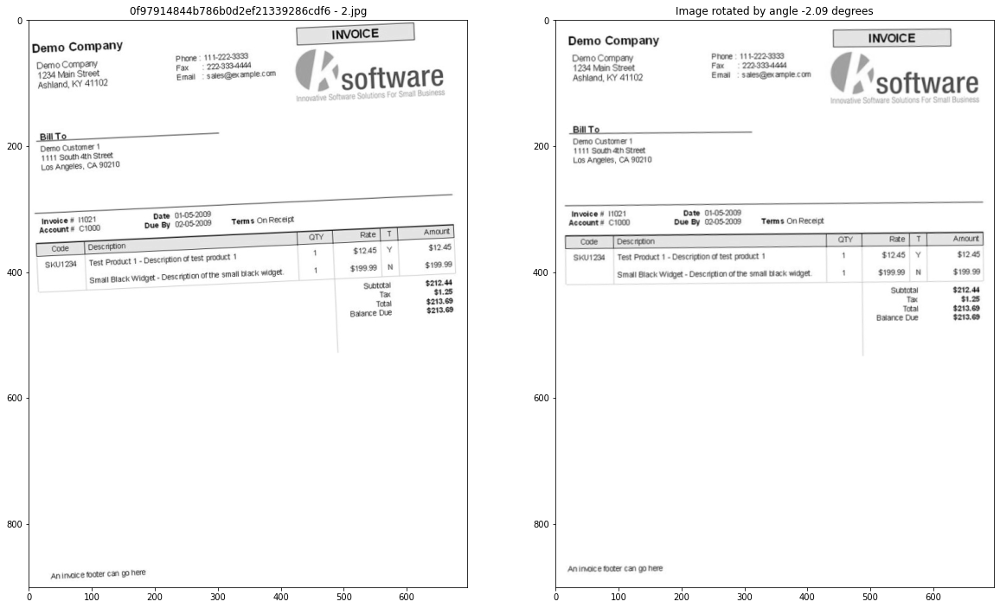

data/misaligned_images/misaligned_images/10.jpg


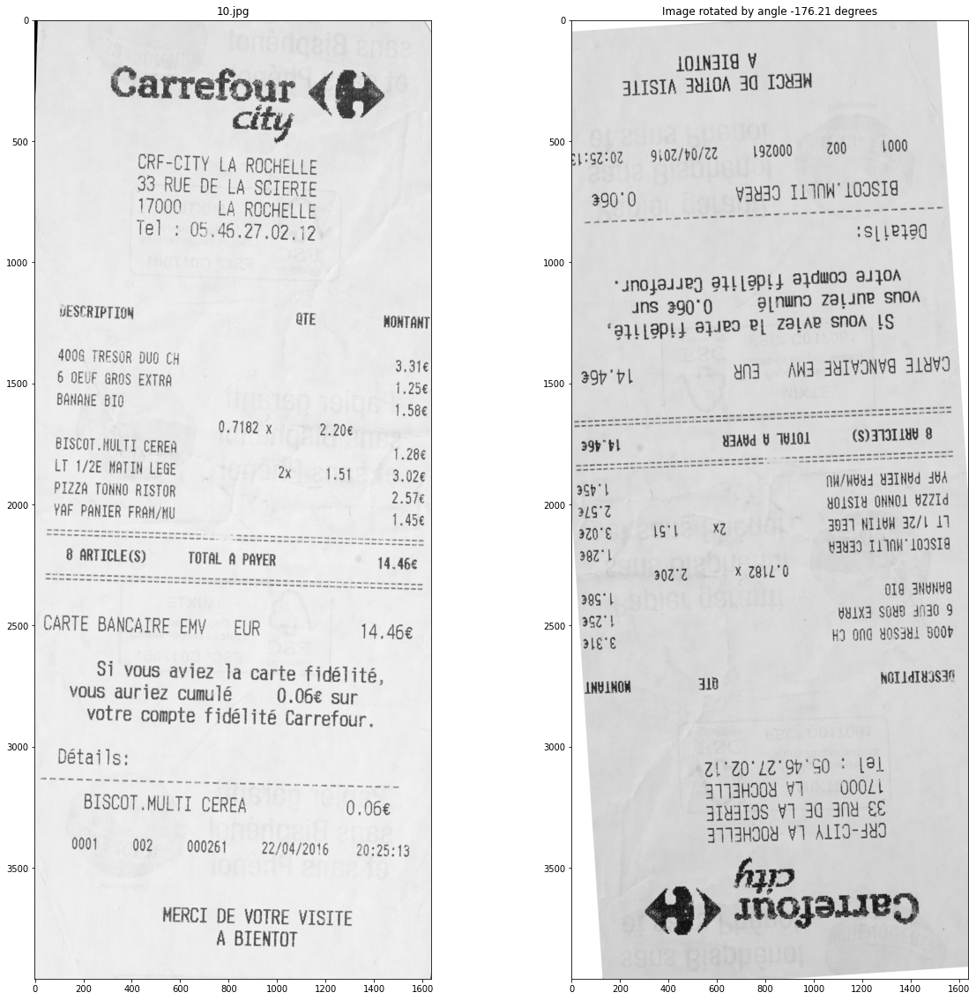

data/misaligned_images/misaligned_images/6 2.jpg


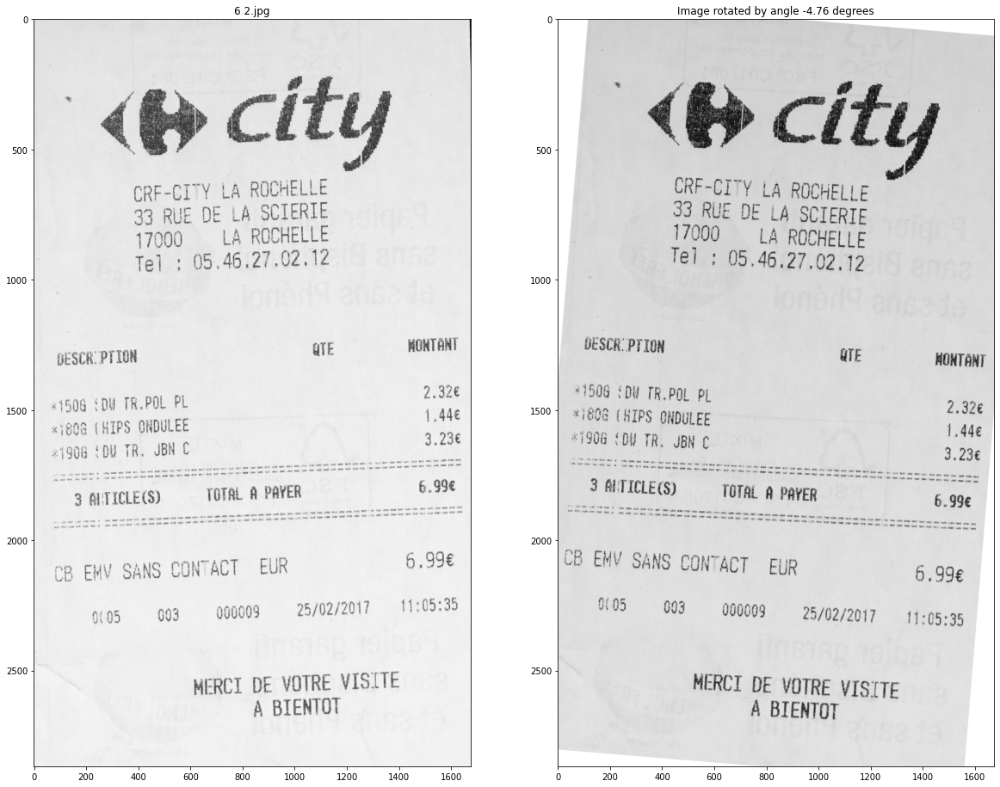

data/misaligned_images/misaligned_images/5f228310d55c683ed29aa8c0adda7efc.jpg


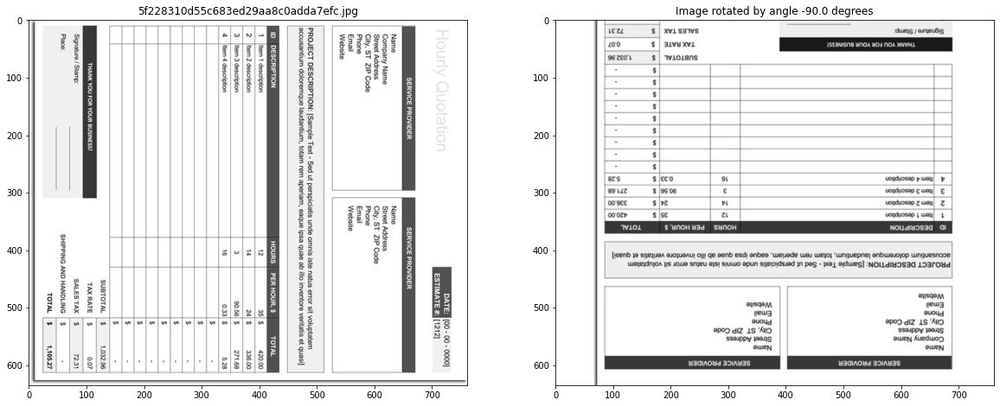

data/misaligned_images/misaligned_images/AWT009.jpg


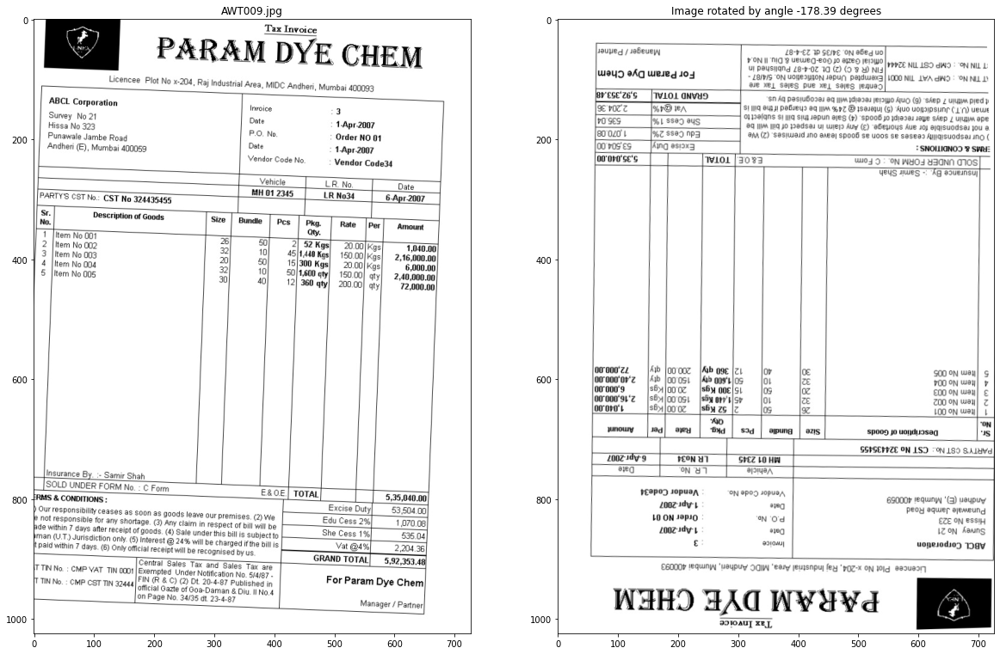

data/misaligned_images/misaligned_images/4.jpg


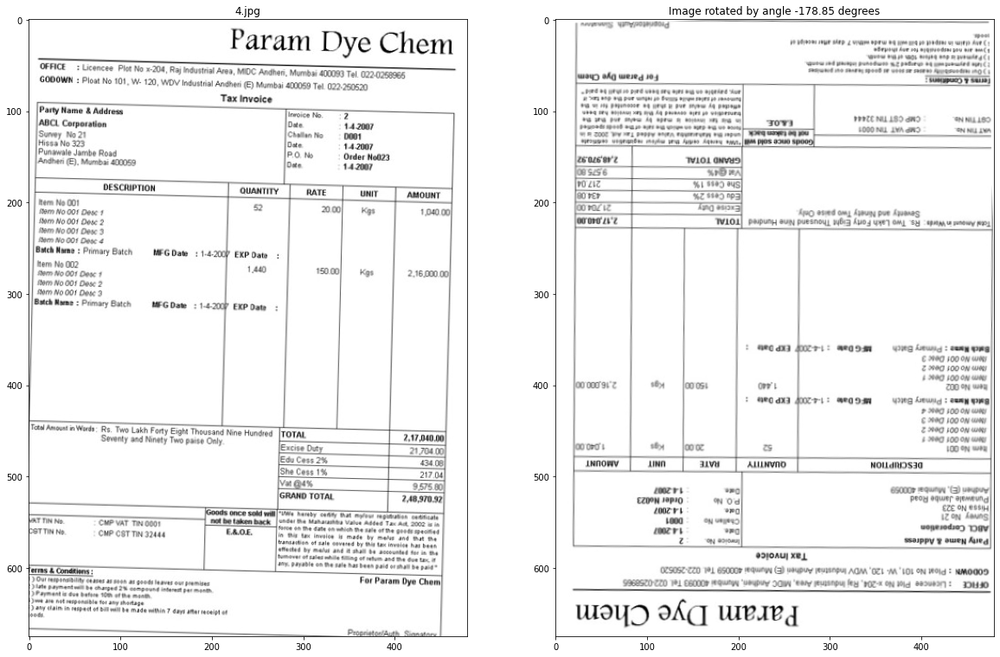

data/misaligned_images/misaligned_images/billing-invoice-for-legal-services.jpg


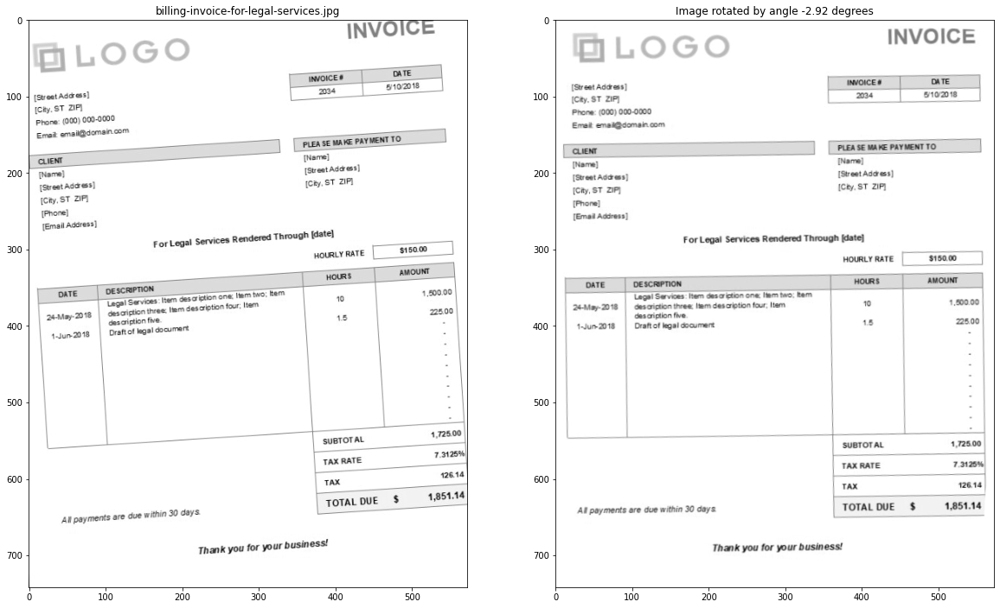

data/misaligned_images/misaligned_images/5.jpg


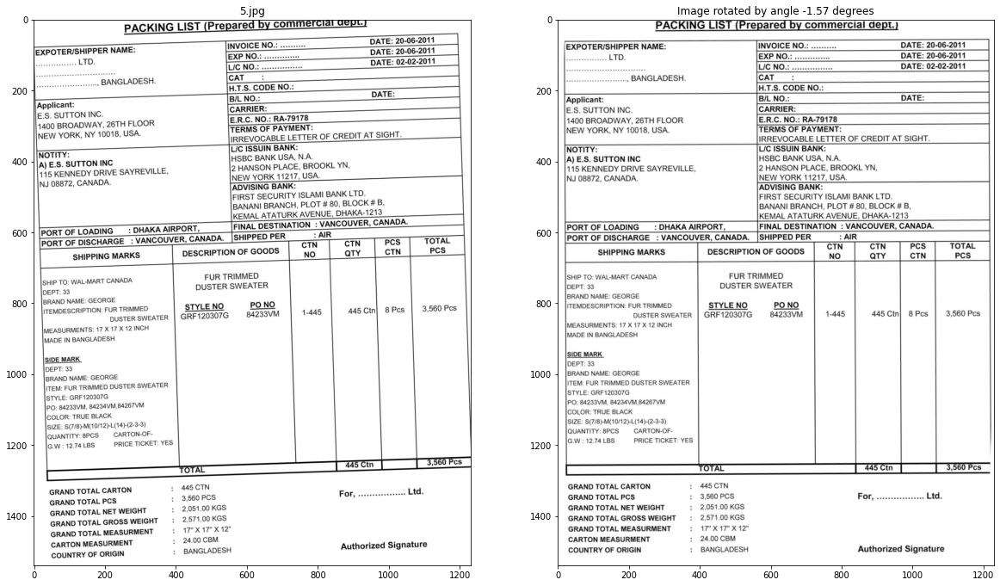

data/misaligned_images/misaligned_images/7.jpg


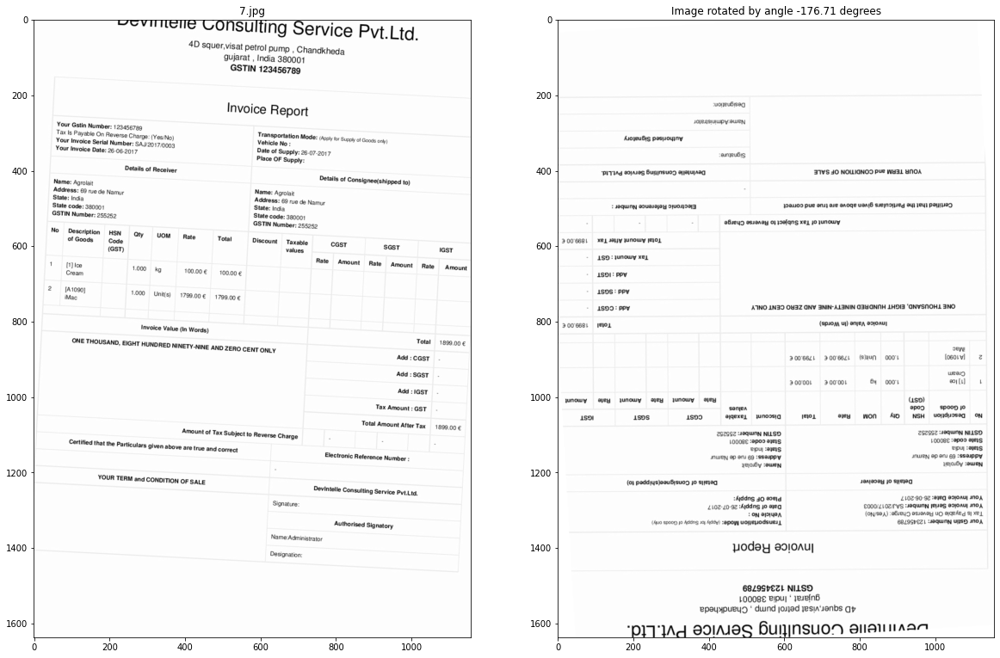

data/misaligned_images/misaligned_images/6.jpg


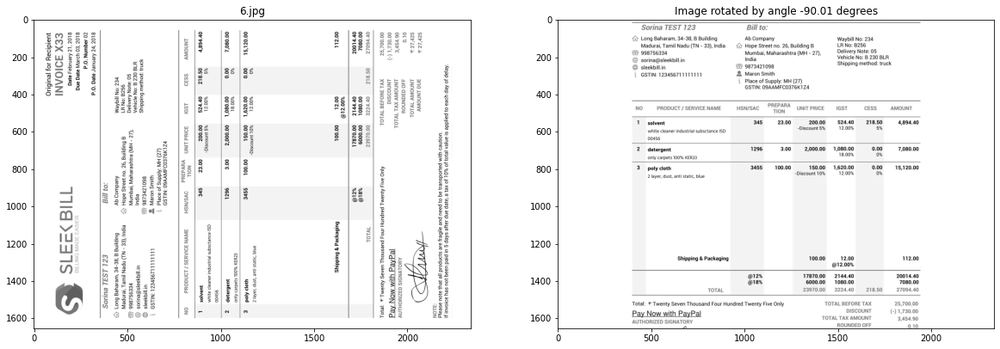

data/misaligned_images/misaligned_images/0e27f636242845138158f132878a3351.jpg


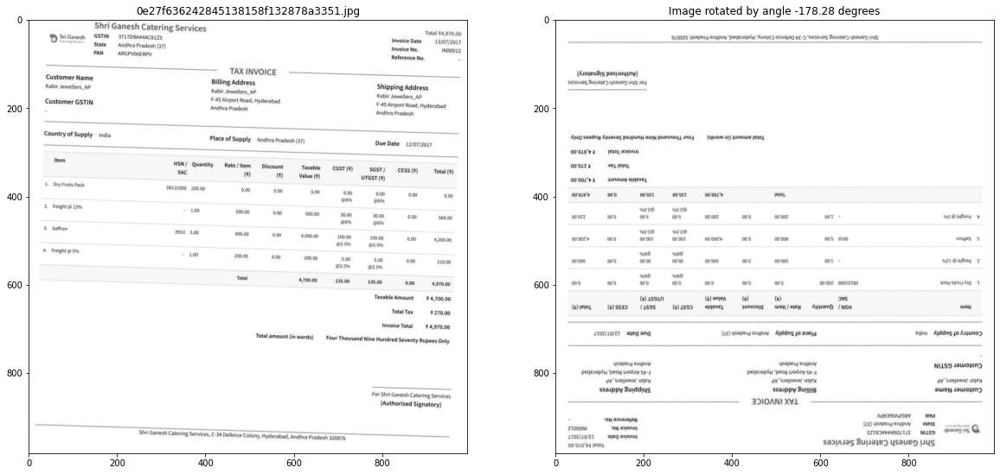

data/misaligned_images/misaligned_images/law-firm-invoice-template.jpg_out.jpg


/home/dev2/anaconda3/envs/image_alignment/lib/python3.9/site-packages/scipy/stats/_stats_mstats_common.py:170: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
/home/dev2/anaconda3/envs/image_alignment/lib/python3.9/site-packages/scipy/stats/_stats_mstats_common.py:187: RuntimeWarning: divide by zero encountered in double_scalars
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)
/home/dev2/anaconda3/envs/image_alignment/lib/python3.9/site-packages/matplotlib/image.py:443: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/home/dev2/anaconda3/envs/image_alignment/lib/python3.9/site-packages/matplotlib/image.py:444: UserWarning: Warning: converting a masked element to nan.
  vmid = np.float64(self.norm.vmin) + dv / 2


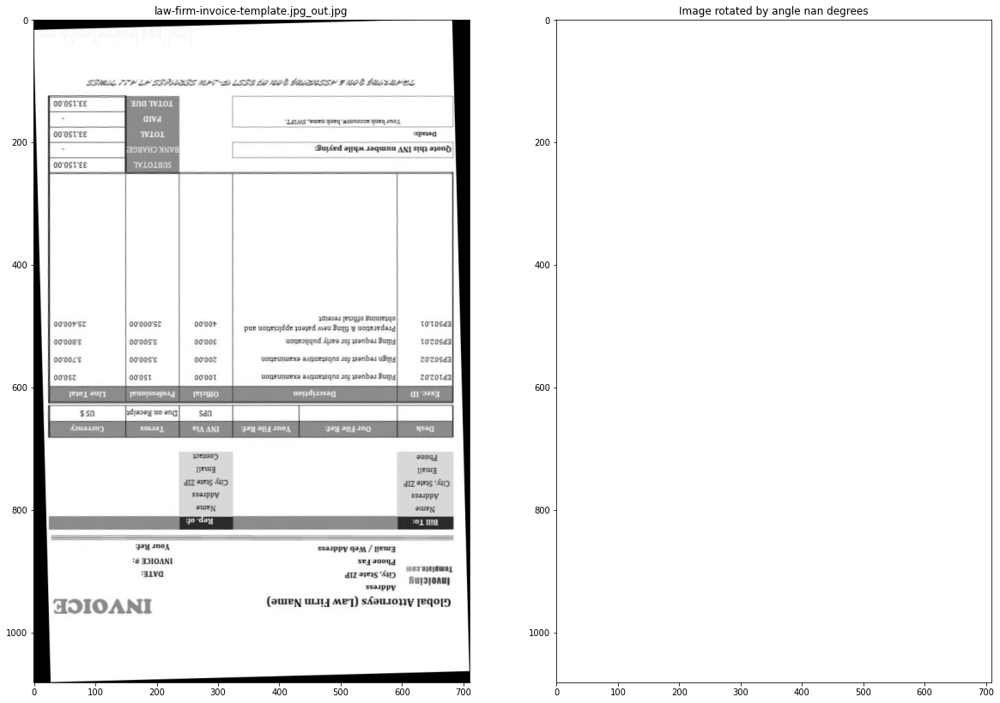

data/misaligned_images/misaligned_images/0f97914844b786b0d2ef21339286cdf6 - 2.jpg_out.jpg


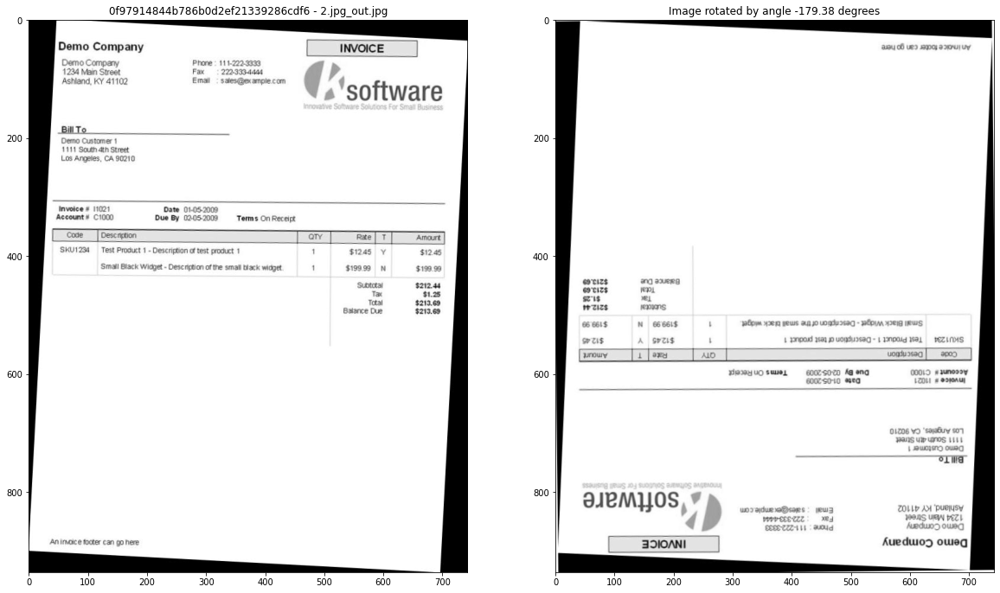

data/misaligned_images/misaligned_images/10.jpg_out.jpg


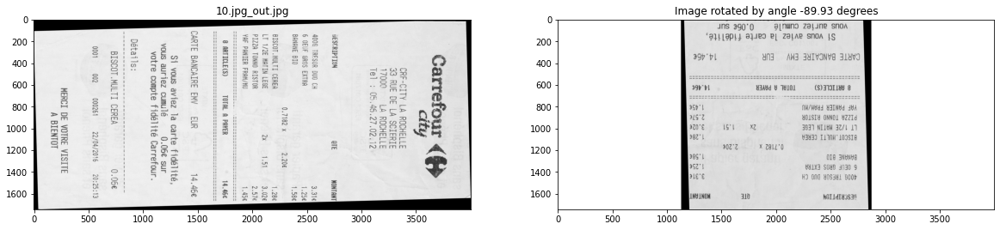

data/misaligned_images/misaligned_images/6 2.jpg_out.jpg


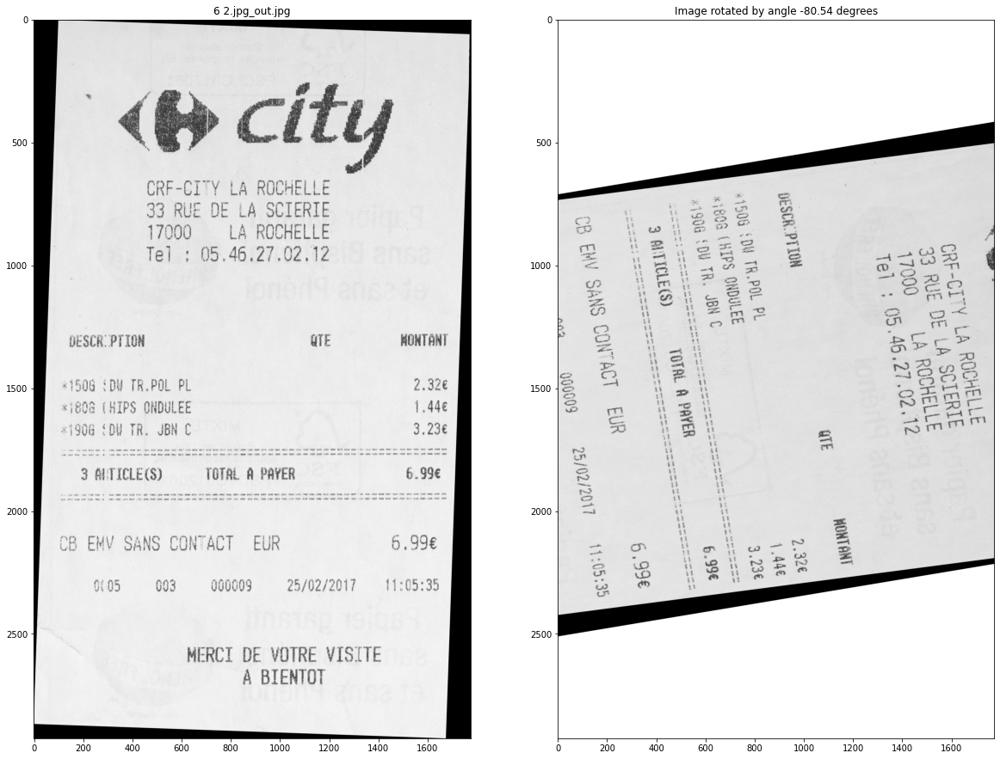

data/misaligned_images/misaligned_images/5f228310d55c683ed29aa8c0adda7efc.jpg_out.jpg


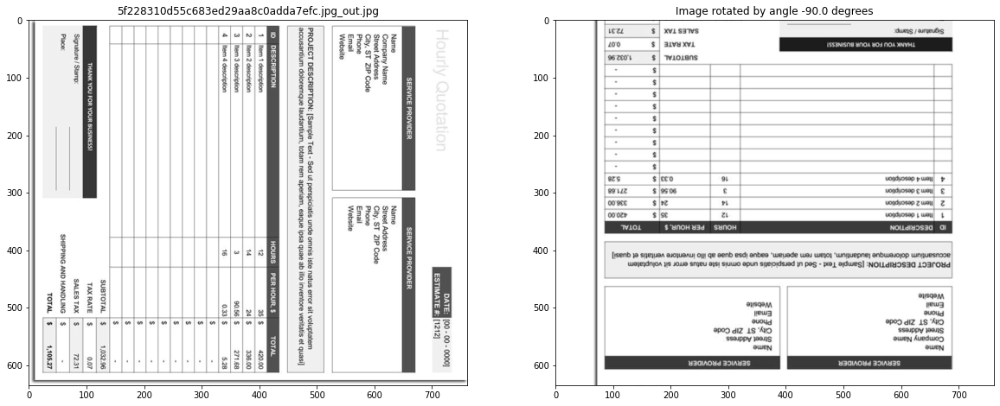

data/misaligned_images/misaligned_images/AWT009.jpg_out.jpg


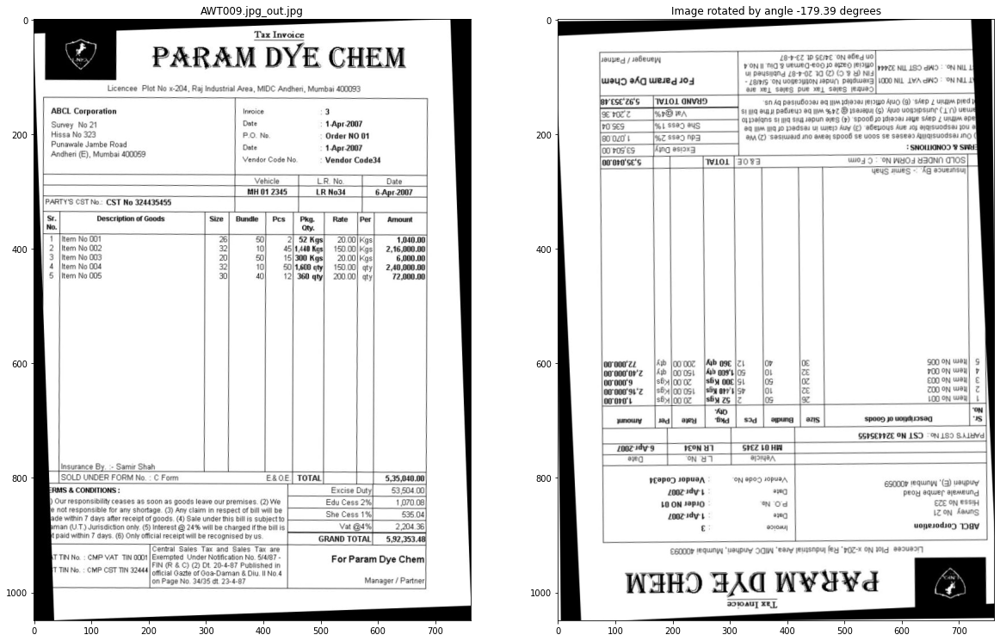

data/misaligned_images/misaligned_images/4.jpg_out.jpg


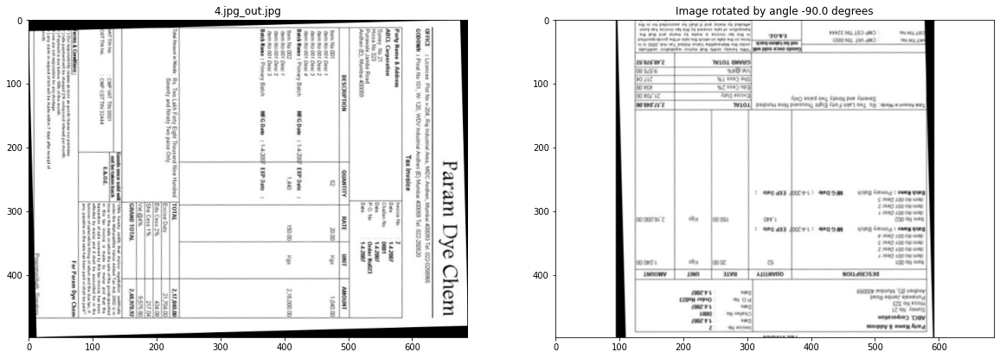

data/misaligned_images/misaligned_images/billing-invoice-for-legal-services.jpg_out.jpg


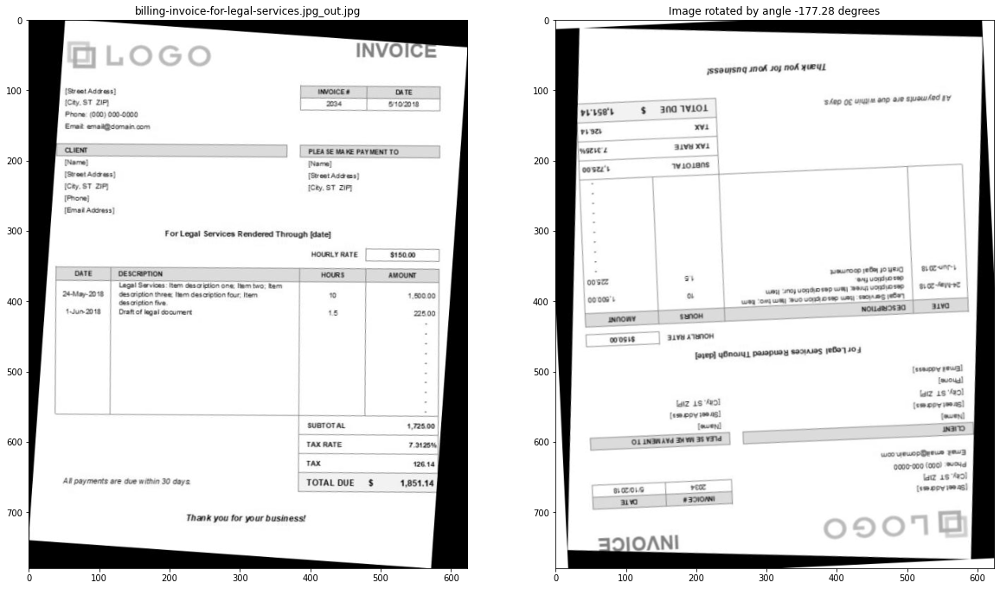

data/misaligned_images/misaligned_images/5.jpg_out.jpg


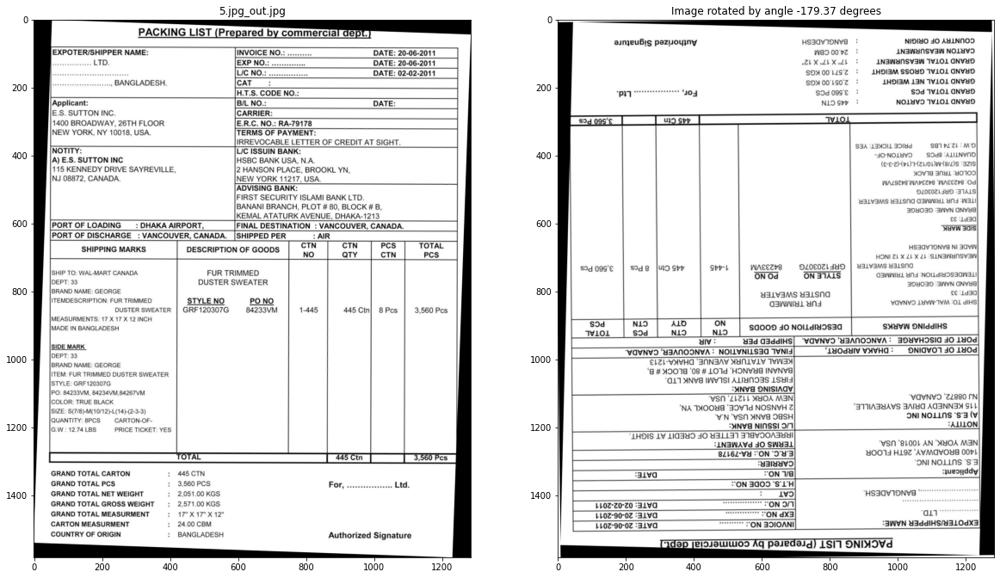

data/misaligned_images/misaligned_images/7.jpg_out.jpg


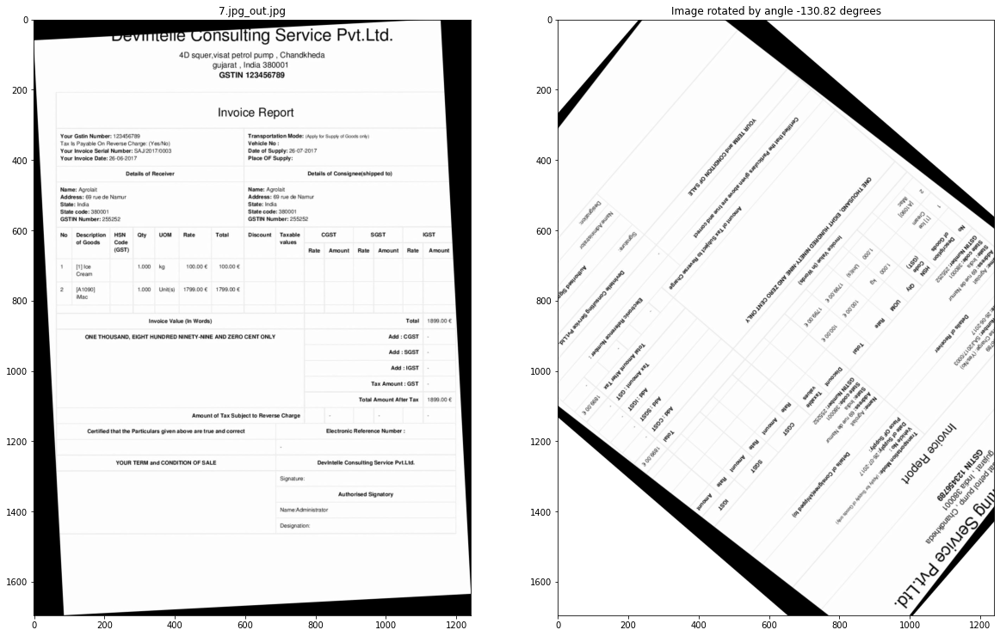

data/misaligned_images/misaligned_images/6.jpg_out.jpg


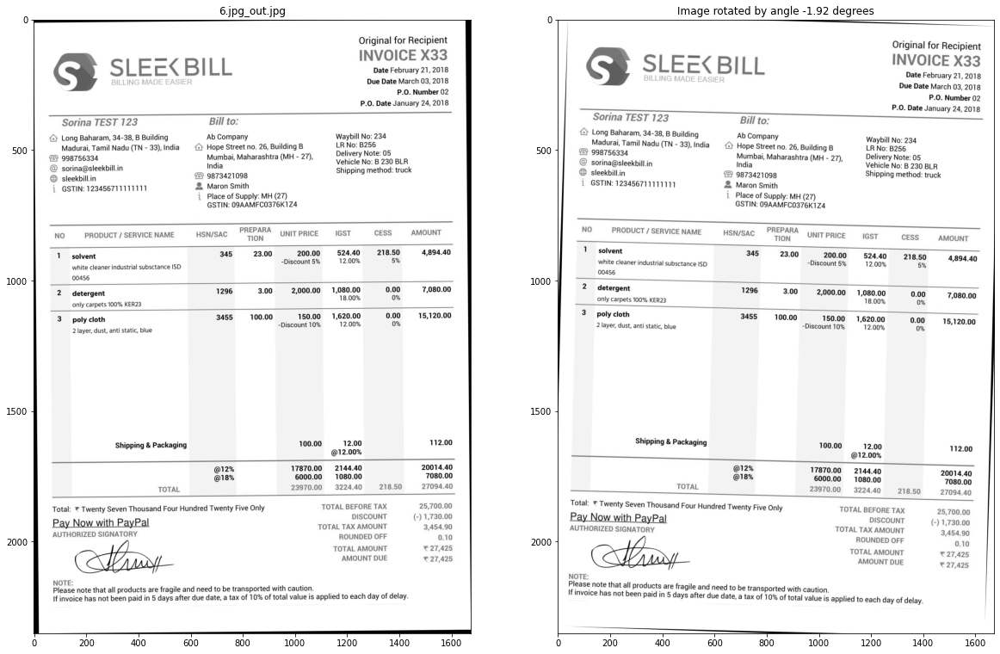

data/misaligned_images/misaligned_images/0e27f636242845138158f132878a3351.jpg_out.jpg


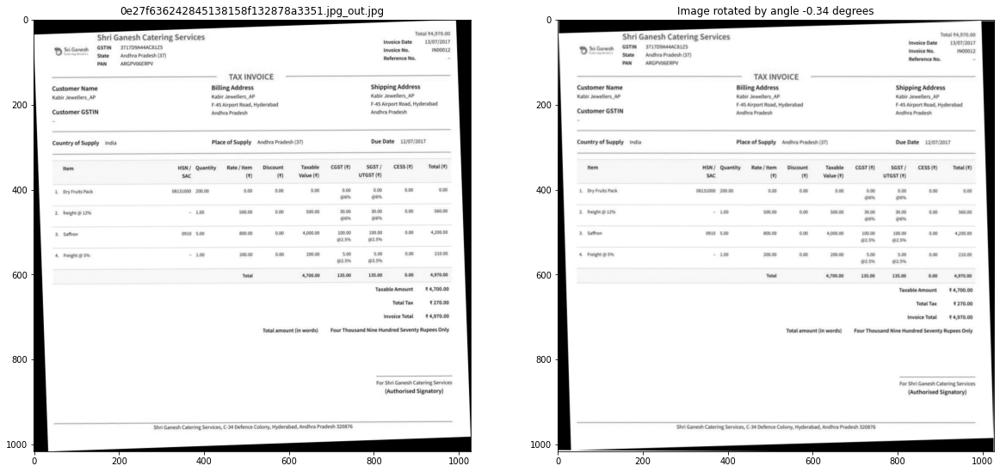

In [44]:
for img_path in tqdm(images_path):
    print(img_path)
    deskew_fft(img_path)